In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import warnings 
warnings.filterwarnings("ignore")

# LOADING THE DATA

In [2]:
df = pd.read_csv('covid_19_clean_complete (4).csv')

In [3]:
df.head()

,Province/State,Country/Region,Lat,Long,Date,Confirmed,Deaths,Recovered,Active,WHO Region
0,NaN,Afghanistan,33.93911,67.709953,2020-01-22,0,0,0,0,Eastern Mediterranean
1,NaN,Albania,41.15330,20.168300,2020-01-22,0,0,0,0,Europe
2,NaN,Algeria,28.03390,1.659600,2020-01-22,0,0,0,0,Africa
3,NaN,Andorra,42.50630,1.521800,2020-01-22,0,0,0,0,Europe
4,NaN,Angola,-11.20270,17.873900,2020-01-22,0,0,0,0,Africa


# SUMMARY OF DATA

In [4]:
print('Data shape:', df.shape)


Data shape: (49068, 10)


In [5]:
print('Data information:', df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 49068 entries, 0 to 49067
Data columns (total 10 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Province/State  14664 non-null  object 
 1   Country/Region  49068 non-null  object 
 2   Lat             49068 non-null  float64
 3   Long            49068 non-null  float64
 4   Date            49068 non-null  object 
 5   Confirmed       49068 non-null  int64  
 6   Deaths          49068 non-null  int64  
 7   Recovered       49068 non-null  int64  
 8   Active          49068 non-null  int64  
 9   WHO Region      49068 non-null  object 
dtypes: float64(2), int64(4), object(4)
memory usage: 3.7+ MB
Data information: None


# FIRST IMPRESSIONS

In [6]:
# 1. 9 columns alltogether
# 2. Province or state column has 70% null values
# 3. Only the numbers of confirmed, deaths, recovered and active have int format
# 4. Rest are all object format
# 5. Location is provided as latitude and longitude in float format
# 6. Date column is in object format and needs to be reformatted into date type


In [7]:
# CONVERTING DATE COLUMN TO DATE TIME FORMAT

df['Date']= pd.to_datetime(df['Date'])

In [8]:
# Checking if its successfully completed

print('Data information:', df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 49068 entries, 0 to 49067
Data columns (total 10 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   Province/State  14664 non-null  object        
 1   Country/Region  49068 non-null  object        
 2   Lat             49068 non-null  float64       
 3   Long            49068 non-null  float64       
 4   Date            49068 non-null  datetime64[ns]
 5   Confirmed       49068 non-null  int64         
 6   Deaths          49068 non-null  int64         
 7   Recovered       49068 non-null  int64         
 8   Active          49068 non-null  int64         
 9   WHO Region      49068 non-null  object        
dtypes: datetime64[ns](1), float64(2), int64(4), object(3)
memory usage: 3.7+ MB
Data information: None


In [9]:
# Renaming columns
df.rename(columns={"Date":"date",
                   "Province/State":"state",
                   "Country/Region":"country",
                   "Lat":"lat","Long":"long",
                   "Confirmed":"confirmed",
                   "Deaths":"deaths",
                   "Recovered":"recovered",
                   "Active":"active"
                   },inplace = True)

In [10]:
# Checking if the number of active cases as number confirmed subtracted with deaths and recovered cases


df[df['active'] == df['confirmed'] - df['deaths'] -df['recovered']]

,state,country,lat,long,date,confirmed,deaths,recovered,active,WHO Region
0,NaN,Afghanistan,33.939110,67.709953,2020-01-22,0,0,0,0,Eastern Mediterranean
1,NaN,Albania,41.153300,20.168300,2020-01-22,0,0,0,0,Europe
2,NaN,Algeria,28.033900,1.659600,2020-01-22,0,0,0,0,Africa
3,NaN,Andorra,42.506300,1.521800,2020-01-22,0,0,0,0,Europe
4,NaN,Angola,-11.202700,17.873900,2020-01-22,0,0,0,0,Africa
...,...,...,...,...,...,...,...,...,...,...
49063,NaN,Sao Tome and Principe,0.186400,6.613100,2020-07-27,865,14,734,117,Africa
49064,NaN,Yemen,15.552727,48.516388,2020-07-27,1691,483,833,375,Eastern Mediterranean
49065,NaN,Comoros,-11.645500,43.333300,2020-07-27,354,7,328,19,Africa
49066,NaN,Tajikistan,38.861000,71.276100,2020-07-27,7235,60,6028,1147,Europe


In [11]:
# Reassigning the active to the above formula

df["active"]=df["confirmed"]-df["deaths"]-df["recovered"] 


In [12]:
# Analysis of the first and last date

# FIRST DATE
first=df[df["date"]=="2020-01-22"]
first

,state,country,lat,long,date,confirmed,deaths,recovered,active,WHO Region
0,NaN,Afghanistan,33.939110,67.709953,2020-01-22,0,0,0,0,Eastern Mediterranean
1,NaN,Albania,41.153300,20.168300,2020-01-22,0,0,0,0,Europe
2,NaN,Algeria,28.033900,1.659600,2020-01-22,0,0,0,0,Africa
3,NaN,Andorra,42.506300,1.521800,2020-01-22,0,0,0,0,Europe
4,NaN,Angola,-11.202700,17.873900,2020-01-22,0,0,0,0,Africa
...,...,...,...,...,...,...,...,...,...,...
256,NaN,Sao Tome and Principe,0.186400,6.613100,2020-01-22,0,0,0,0,Africa
257,NaN,Yemen,15.552727,48.516388,2020-01-22,0,0,0,0,Eastern Mediterranean
258,NaN,Comoros,-11.645500,43.333300,2020-01-22,0,0,0,0,Africa
259,NaN,Tajikistan,38.861000,71.276100,2020-01-22,0,0,0,0,Europe


In [13]:
first[first['confirmed'] >1]

# INSIGHTS

# When the data collection started confirmed cases were only found in China with the Hubei province ranking the most 
# cases 

# Hubei province was the first to also se deaths 


,state,country,lat,long,date,confirmed,deaths,recovered,active,WHO Region
49,Beijing,China,40.182400,116.414200,2020-01-22,14,0,0,14,Western Pacific
50,Chongqing,China,30.057200,107.874000,2020-01-22,6,0,0,6,Western Pacific
53,Guangdong,China,23.341700,113.424400,2020-01-22,26,0,0,26,Western Pacific
54,Guangxi,China,23.829800,108.788100,2020-01-22,2,0,0,2,Western Pacific
56,Hainan,China,19.195900,109.745300,2020-01-22,4,0,0,4,Western Pacific
59,Henan,China,37.895700,114.904200,2020-01-22,5,0,0,5,Western Pacific
61,Hubei,China,30.975600,112.270700,2020-01-22,444,17,28,399,Western Pacific
62,Hunan,China,27.610400,111.708800,2020-01-22,4,0,0,4,Western Pacific
65,Jiangxi,China,27.614000,115.722100,2020-01-22,2,0,0,2,Western Pacific
67,Liaoning,China,41.295600,122.608500,2020-01-22,2,0,0,2,Western Pacific


In [14]:
# LAST DATE

recent=df[df["date"]=="2020-07-27"]
recent

,state,country,lat,long,date,confirmed,deaths,recovered,active,WHO Region
48807,NaN,Afghanistan,33.939110,67.709953,2020-07-27,36263,1269,25198,9796,Eastern Mediterranean
48808,NaN,Albania,41.153300,20.168300,2020-07-27,4880,144,2745,1991,Europe
48809,NaN,Algeria,28.033900,1.659600,2020-07-27,27973,1163,18837,7973,Africa
48810,NaN,Andorra,42.506300,1.521800,2020-07-27,907,52,803,52,Europe
48811,NaN,Angola,-11.202700,17.873900,2020-07-27,950,41,242,667,Africa
...,...,...,...,...,...,...,...,...,...,...
49063,NaN,Sao Tome and Principe,0.186400,6.613100,2020-07-27,865,14,734,117,Africa
49064,NaN,Yemen,15.552727,48.516388,2020-07-27,1691,483,833,375,Eastern Mediterranean
49065,NaN,Comoros,-11.645500,43.333300,2020-07-27,354,7,328,19,Africa
49066,NaN,Tajikistan,38.861000,71.276100,2020-07-27,7235,60,6028,1147,Europe


In [15]:
recent[recent['confirmed'] == 4290259]

# Highest cases were registered in the USA on 27 July 2020
# Top 5 countries were USA, Brazil, India, Russia and South africa


recent[recent['confirmed'] > 100000].sort_values(by = 'confirmed', ascending = False)

,state,country,lat,long,date,confirmed,deaths,recovered,active,WHO Region
49030,NaN,US,40.000000,-100.000000,2020-07-27,4290259,148011,1325804,2816444,Americas
48835,NaN,Brazil,-14.235000,-51.925300,2020-07-27,2442375,87618,1846641,508116,Americas
48936,NaN,India,20.593684,78.962880,2020-07-27,1480073,33408,951166,495499,South-East Asia
48992,NaN,Russia,61.524010,105.318756,2020-07-27,816680,13334,602249,201097,Europe
49005,NaN,South Africa,-30.559500,22.937500,2020-07-27,452529,7067,274925,170537,Africa
48963,NaN,Mexico,23.634500,-102.552800,2020-07-27,395489,44022,303810,47657,Americas
48986,NaN,Peru,-9.190000,-75.015200,2020-07-27,389717,18418,272547,98752,Americas
48854,NaN,Chile,-35.675100,-71.543000,2020-07-27,347923,9187,319954,18782,Americas
49028,NaN,United Kingdom,55.378100,-3.436000,2020-07-27,300111,45759,0,254352,Europe
48938,NaN,Iran,32.427908,53.688046,2020-07-27,293606,15912,255144,22550,Eastern Mediterranean


In [16]:
# Creating a dataframe globally by adding up the cases for the whole world grouped by country 
world=df.groupby("country").sum()[["confirmed","deaths","recovered","active"]].reset_index()
world

,country,confirmed,deaths,recovered,active
0,Afghanistan,1936390,49098,798240,1089052
1,Albania,196702,5708,118877,72117
2,Algeria,1179755,77972,755897,345886
3,Andorra,94404,5423,69074,19907
4,Angola,22662,1078,6573,15011
...,...,...,...,...,...
182,West Bank and Gaza,233461,1370,61124,170967
183,Western Sahara,901,63,648,190
184,Yemen,67180,17707,23779,25694
185,Zambia,129421,2643,83611,43167


In [17]:
# Creating a dataframe with total no of cases for every country

# CONFIRMED CASES

con_cases = pd.DataFrame(df.groupby('country')['confirmed'].sum()).reset_index()
con_cases.set_index(np.arange(1,188), inplace = True)

In [18]:
fig = px.bar(con_cases.sort_values('confirmed',ascending=False)[:20][::-1],x='confirmed',
             y='country',title='Confirmed Cases Worldwide',text='confirmed', height=900, orientation='h', color = 'confirmed')
fig.show()

In [19]:
con_cases.sort_values('confirmed',ascending=False)[:20][::-1]

,country,confirmed
14,Bangladesh,8754729
33,Canada,9356551
155,South Africa,11168743
146,Saudi Arabia,12362961
129,Pakistan,12833994
37,China,14132002
112,Mexico,14946202
36,Chile,16935654
173,Turkey,17903345
133,Peru,19263916


In [20]:
# DEATHS 

deaths = pd.DataFrame(df.groupby('country')['deaths'].sum()).reset_index()
deaths.set_index(np.arange(1,188), inplace = True)

In [21]:
fig = px.bar(deaths.sort_values('deaths',ascending=False)[:20][::-1],x='deaths',
             y='country',title='Worldwide Deaths',text='deaths', height=900, orientation='h', color = 'deaths')
fig.show()

In [22]:
figure = px.choropleth(df,locations="country",
                       locationmode = "country names", color="deaths",
                       hover_name="country",range_color=[1,10000],
                       color_continuous_scale="blues",
                       title="Countries with deaths Cases")
figure.show()

In [23]:
# ACTIVE CASES WORLDWIDE

active_cases = pd.DataFrame(df.groupby('country')['active'].sum()).reset_index()
active_cases .set_index(np.arange(1,188), inplace = True)

fig = px.bar(active_cases .sort_values('active',ascending=False)[:20][::-1],x='active',
             y='country',title='Worldwide Active cases',text='active', height=900, orientation='h', color = 'active')
fig.show()

In [24]:
figure = px.choropleth(df,locations="country",
                       locationmode = "country names", color="active",
                       hover_name="country",range_color=[1,20000],
                       color_continuous_scale="greens",
                       title="Countries with Active Cases")
figure.show()

In [25]:
# RECOVERED CASES WORLDWIDE

recovered_cases = pd.DataFrame(df.groupby('country')['recovered'].sum()).reset_index()
recovered_cases .set_index(np.arange(1,188), inplace = True)

fig = px.bar(recovered_cases.sort_values('recovered',ascending=False)[:20][::-1],x='recovered',
             y='country',title='Worldwide Recovered cases',text='recovered', color = 'recovered',height=900, orientation='h')
fig.show()

In [26]:
figure = px.choropleth(df,locations="country",
                       locationmode = "country names", color="recovered",
                       hover_name="country",range_color=[1,10000],
                       color_continuous_scale="blues",
                       title="Countries with recovered Cases")
figure.show()

In [27]:
# Analysing how covid spread over time

total=df.groupby(['date'])['confirmed','deaths','recovered','active'].sum().reset_index()
total

,date,confirmed,deaths,recovered,active
0,2020-01-22,555,17,28,510
1,2020-01-23,654,18,30,606
2,2020-01-24,941,26,36,879
3,2020-01-25,1434,42,39,1353
4,2020-01-26,2118,56,52,2010
...,...,...,...,...,...
183,2020-07-23,15510481,633506,8710969,6166006
184,2020-07-24,15791645,639650,8939705,6212290
185,2020-07-25,16047190,644517,9158743,6243930
186,2020-07-26,16251796,648621,9293464,6309711


<Axes: xlabel='deaths', ylabel='recovered'>

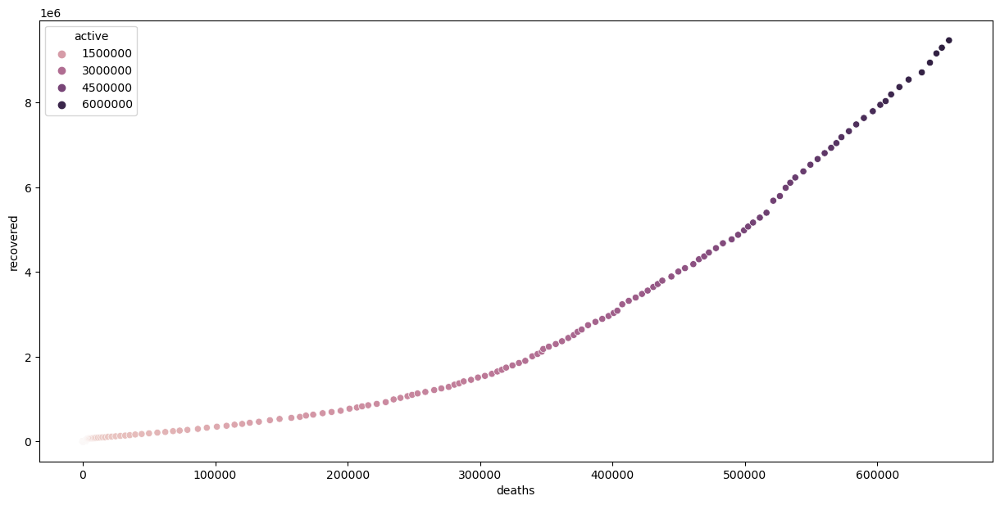

In [28]:
plt.figure(figsize =(15,7))
sns.scatterplot(x = total['deaths'], y = total['recovered'], hue = total['active'])

<Figure size 2500x1000 with 0 Axes>

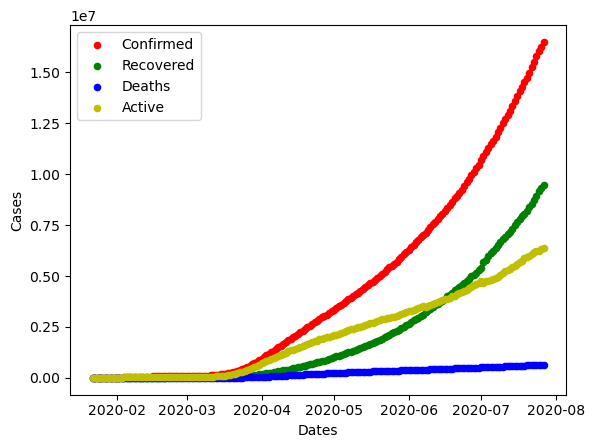

In [31]:
# # TREND OF HOW COVID SPREAD

plt.figure(figsize=(25,10))
ax1=total.plot(kind='scatter', x='date', y='confirmed', color='r', label='Confirmed')
ax2=total.plot(kind='scatter', x='date', y='recovered', color='g', label='Recovered', ax = ax1)
ax3=total.plot(kind='scatter', x='date', y='deaths', color='b', label='Deaths', ax= ax2)
ax4=total.plot(kind='scatter', x='date', y='active', color='y', label='Active', ax = ax3)
ax1.set(xlabel = 'Dates', ylabel = 'Cases')
plt.show()

# INSIGHTS

# 1.  The spread started to intensity after april 2020 and peaked at around July and 
# hasnt stabilised until the last day of data
# 2. The confirmed and recovered cases have a parallel slope 
# 3. Deaths has consistenly increased over time 

In [32]:
px.histogram(total, x="deaths", y="recovered", color="active")

In [34]:
# TOP 20 COUNTRIES AND COVID PREVELANCE

# CONFIRMED CASES

top20confirmed = df.groupby('country')['confirmed'].sum().sort_values(ascending=False).head(20).reset_index()
top20confirmed

,country,confirmed
0,US,224345948
1,Brazil,89524967
2,Russia,45408411
3,India,40883464
4,Spain,27404045
5,United Kingdom,26748587
6,Italy,26745145
7,France,21210926
8,Germany,21059152
9,Iran,19339267


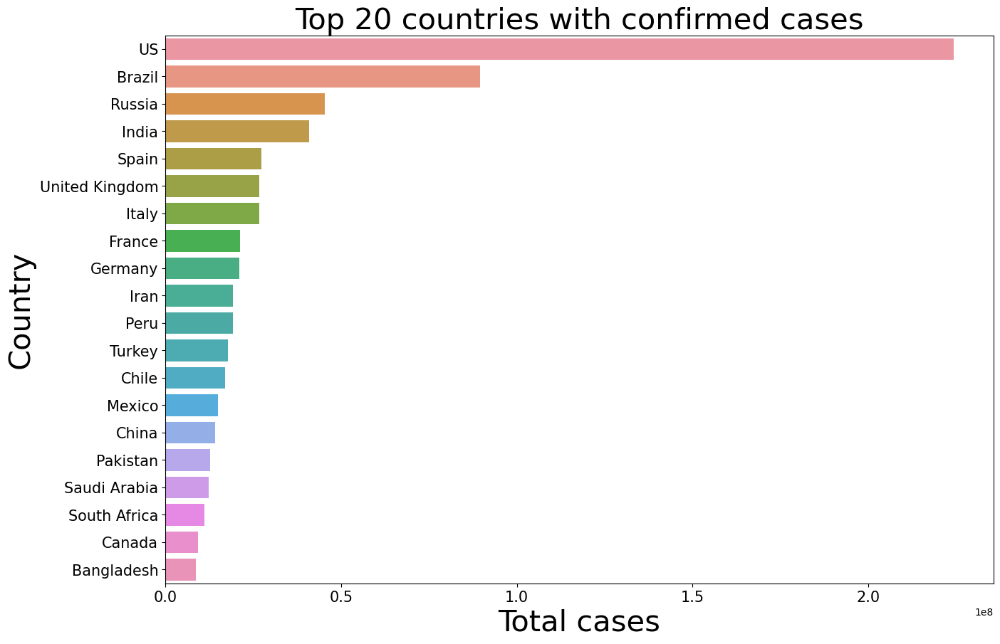

In [35]:
# Plotting this data as bar plots

plt.figure(figsize=(15,10))
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.xlabel("Total cases",fontsize=30)
plt.ylabel("Country",fontsize=30)
plt.title("Top 20 countries with confirmed cases",fontsize=30)
ax = sns.barplot(x=top20confirmed.confirmed, y=top20confirmed.country)
ax.set(xlabel="Total cases",ylabel="Country")
plt.show()

In [36]:
# DEATHS 

top20deaths = df.groupby('country')['deaths'].sum().sort_values(ascending=False).head(20).reset_index()
top20deaths

,country,deaths
0,US,11011411
1,United Kingdom,3997775
2,Brazil,3938034
3,Italy,3707717
4,France,3048524
5,Spain,3033030
6,Mexico,1728277
7,India,1111831
8,Iran,1024136
9,Belgium,963679


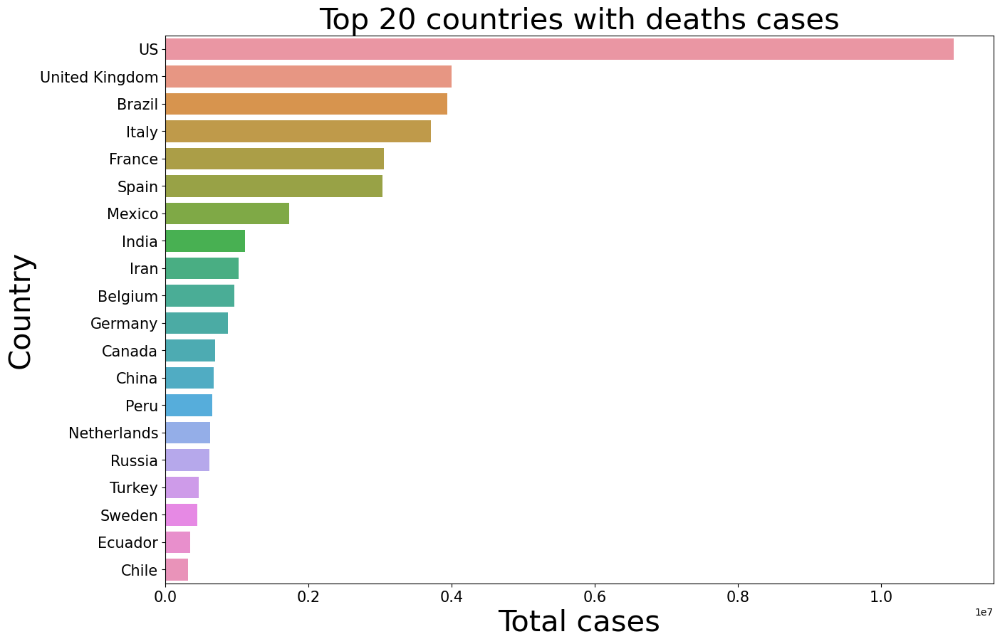

In [37]:
# Plotting top 20 deaths as data as bar plots

plt.figure(figsize=(15,10))
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.xlabel("Total cases",fontsize=30)
plt.ylabel("Country",fontsize=30)
plt.title("Top 20 countries with deaths cases",fontsize=30)
ax = sns.barplot(x=top20deaths.deaths, y=top20deaths.country)
ax.set(xlabel="Total cases",ylabel="Country")
plt.show()

In [38]:
# ACTIVE CASES
top20active = df.groupby('country')['active'].sum().sort_values(ascending=False).head(20).reset_index()
top20active

,country,active
0,US,156981121
1,Brazil,31094060
2,United Kingdom,22624595
3,Russia,19668578
4,India,15987913
5,France,10980287
6,Spain,9277432
7,Canada,8656985
8,Peru,7748957
9,Italy,7363518


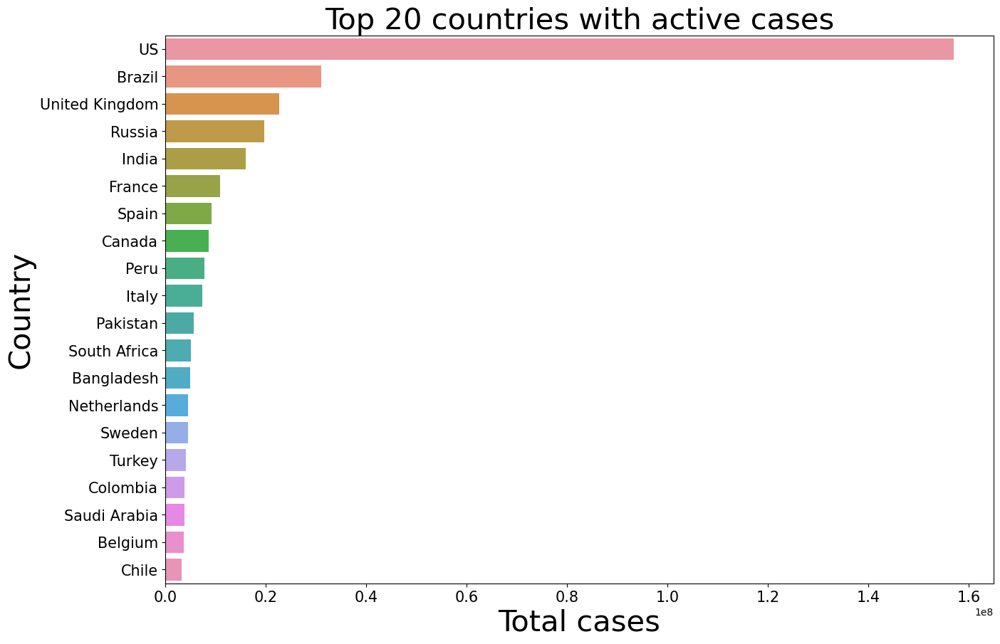

In [39]:
# Plotting top 20 active casesas data as bar plots

plt.figure(figsize=(15,10))
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.xlabel("Total cases",fontsize=30)
plt.ylabel("Country",fontsize=30)
plt.title("Top 20 countries with active cases",fontsize=30)
ax = sns.barplot(x=top20active.active, y=top20active.country)
ax.set(xlabel="Total cases",ylabel="Country")
plt.show()

In [40]:
# RECOVERED CASES
top20recovered = df.groupby('country')['recovered'].sum().sort_values(ascending=False).head(20).reset_index()
top20recovered

,country,recovered
0,US,56353416
1,Brazil,54492873
2,Russia,25120448
3,India,23783720
4,Germany,17107839
5,Italy,15673910
6,Iran,15200895
7,Spain,15093583
8,Turkey,13345389
9,Chile,13292593


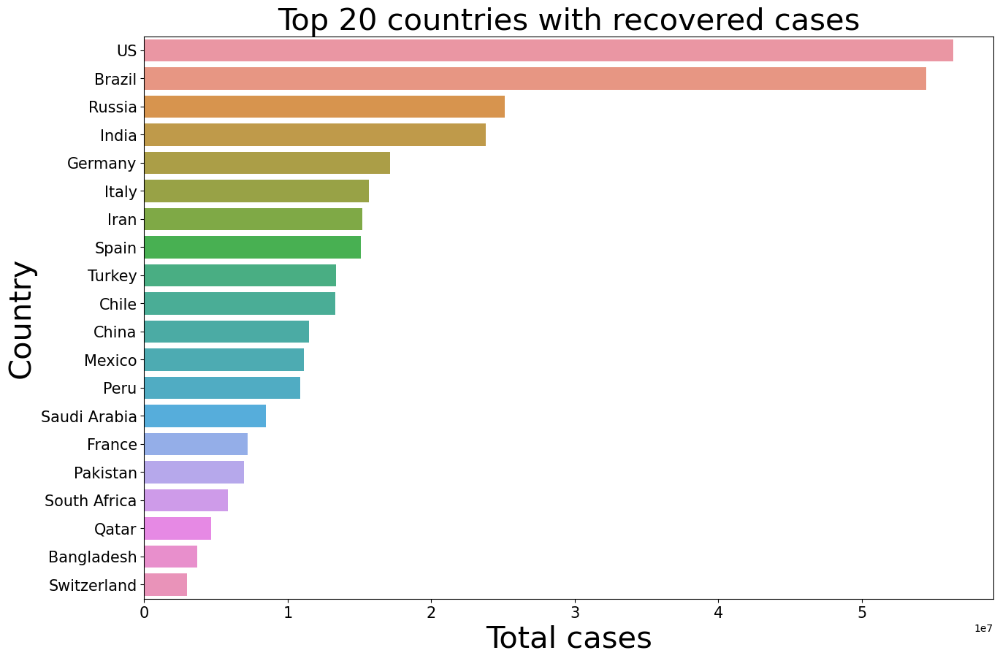

In [41]:
# Plotting top 20 recovered cases data as bar plots

plt.figure(figsize=(15,10))
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.xlabel("Total cases",fontsize=30)
plt.ylabel("Country",fontsize=30)
plt.title("Top 20 countries with recovered cases",fontsize=30)
ax = sns.barplot(x=top20recovered.recovered, y=top20recovered.country)
ax.set(xlabel="Total cases",ylabel="Country")
plt.show()

In [45]:
# TOP 5 COUNTRIES WITH MOST ACTIVE CASES ARE

# 1. USA
# 2. BRAZIL
# 3. UNITED KINGDOM
# 4. RUSSIA
# 5. INDIA

In [46]:
# Visualising the spread of covid for the top 5 country over time 

In [47]:
# USA

usa = df[df['country'] == 'US']
usa = usa.groupby(by = 'date')['confirmed','deaths','recovered', 'active'].sum().reset_index()
usa

,date,confirmed,deaths,recovered,active
0,2020-01-22,1,0,0,1
1,2020-01-23,1,0,0,1
2,2020-01-24,2,0,0,2
3,2020-01-25,2,0,0,2
4,2020-01-26,5,0,0,5
...,...,...,...,...,...
183,2020-07-23,4038816,144430,1233269,2661117
184,2020-07-24,4112531,145560,1261624,2705347
185,2020-07-25,4178970,146465,1279414,2753091
186,2020-07-26,4233923,146935,1297863,2789125


In [48]:
# BRAZIL

brazil = df[df['country'] == 'Brazil']
brazil = brazil.groupby(by = 'date')['confirmed','deaths','recovered', 'active'].sum().reset_index()
brazil

,date,confirmed,deaths,recovered,active
0,2020-01-22,0,0,0,0
1,2020-01-23,0,0,0,0
2,2020-01-24,0,0,0,0
3,2020-01-25,0,0,0,0
4,2020-01-26,0,0,0,0
...,...,...,...,...,...
183,2020-07-23,2287475,84082,1620313,583080
184,2020-07-24,2343366,85238,1693214,564914
185,2020-07-25,2394513,86449,1785359,522705
186,2020-07-26,2419091,87004,1812913,519174


In [49]:
# UNITED KINGDOM

uk = df[df['country'] == 'United Kingdom']
uk = uk.groupby(by = 'date')['confirmed','deaths','recovered', 'active'].sum().reset_index()
uk

,date,confirmed,deaths,recovered,active
0,2020-01-22,0,0,0,0
1,2020-01-23,0,0,0,0
2,2020-01-24,0,0,0,0
3,2020-01-25,0,0,0,0
4,2020-01-26,0,0,0,0
...,...,...,...,...,...
183,2020-07-23,298731,45639,1425,251667
184,2020-07-24,299500,45762,1425,252313
185,2020-07-25,300270,45823,1427,253020
186,2020-07-26,301020,45837,1434,253749


In [50]:
# INDIA

india = df[df['country'] == 'India']
india = india.groupby(by = 'date')['confirmed','deaths','recovered', 'active'].sum().reset_index()
india

,date,confirmed,deaths,recovered,active
0,2020-01-22,0,0,0,0
1,2020-01-23,0,0,0,0
2,2020-01-24,0,0,0,0
3,2020-01-25,0,0,0,0
4,2020-01-26,0,0,0,0
...,...,...,...,...,...
183,2020-07-23,1288108,30601,817209,440298
184,2020-07-24,1337024,31358,849432,456234
185,2020-07-25,1385635,32060,885573,468002
186,2020-07-26,1435616,32771,917568,485277


In [51]:
# RUSSIA
russia = df[df['country'] == 'Russia']
russia= russia.groupby(by = 'date')['confirmed','deaths','recovered', 'active'].sum().reset_index()
russia

,date,confirmed,deaths,recovered,active
0,2020-01-22,0,0,0,0
1,2020-01-23,0,0,0,0
2,2020-01-24,0,0,0,0
3,2020-01-25,0,0,0,0
4,2020-01-26,0,0,0,0
...,...,...,...,...,...
183,2020-07-23,793720,12873,579295,201552
184,2020-07-24,799499,13026,587728,198745
185,2020-07-25,805332,13172,596064,196096
186,2020-07-26,811073,13249,599172,198652


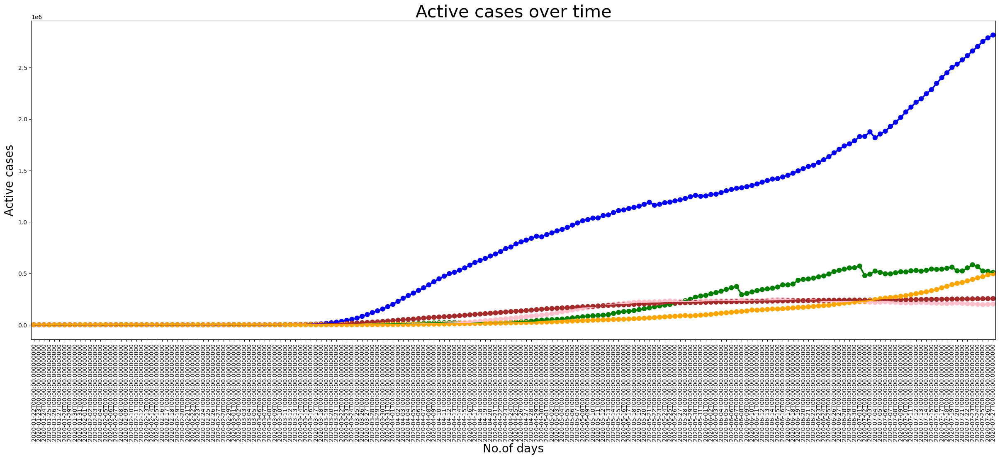

In [52]:
# PLOTTING CHANGE IN ACTIVE CASES OVER TIME IN TOP 5 COUNTRIES

plt.figure(figsize=(30,10))
sns.pointplot(x=brazil.date,y=brazil.active,color="Green")
sns.pointplot(x=usa.date,y=usa.active,color="Blue")
sns.pointplot(x=russia.date,y=russia.active,color="Pink")
sns.pointplot(x=uk.date,y=uk.active,color="Brown")
sns.pointplot(x=india.date,y=india.active,color="Orange")
plt.xlabel('No.of days',fontsize=20)
plt.ylabel('Active cases',fontsize=20)
plt.xticks(rotation=90)
plt.title('Active cases over time',fontsize=30)
plt.show()


# INSIGHTS

# 1. USA has the most active cases among top 5

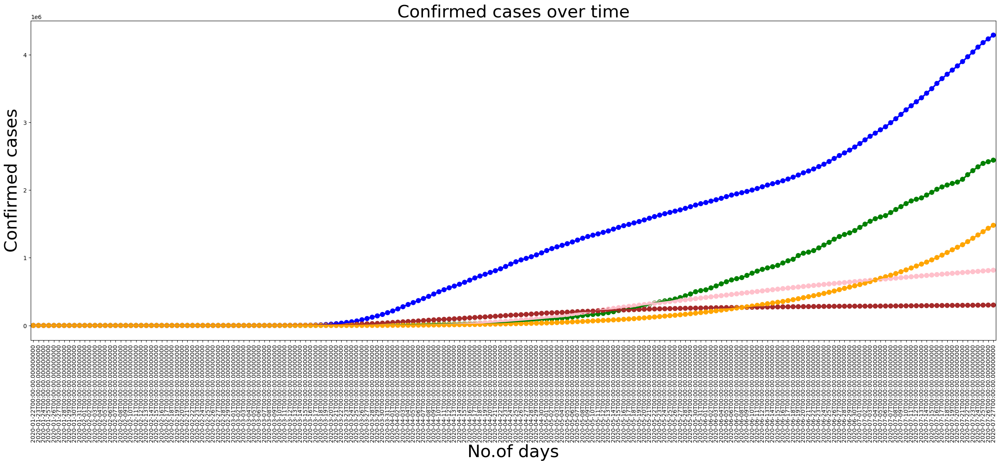

In [53]:
# PLOTTING CHANGE IN CONFIRMED CASES OVER TIME IN TOP 5 COUNTRIES

plt.figure(figsize=(30,10))
sns.pointplot(x=brazil.date,y=brazil.confirmed,color="Green")
sns.pointplot(x=usa.date,y=usa.confirmed,color="Blue")
sns.pointplot(x=russia.date,y=russia.confirmed,color="Pink")
sns.pointplot(x=uk.date,y=uk.confirmed,color="Brown")
sns.pointplot(x=india.date,y=india.confirmed,color="Orange")
plt.xlabel('No.of days',fontsize=30)
plt.ylabel('Confirmed cases',fontsize=30)
plt.xticks(rotation=90)
plt.title('Confirmed cases over time',fontsize=30)
plt.show()

# INSIGHTS

# 1. Usa has the most confirmed cases folowed by Brazil
# 2. India took over the confirmed cases in July 2020 from Russia
# 3. Uk had a decline in confirmed cases during July 2020

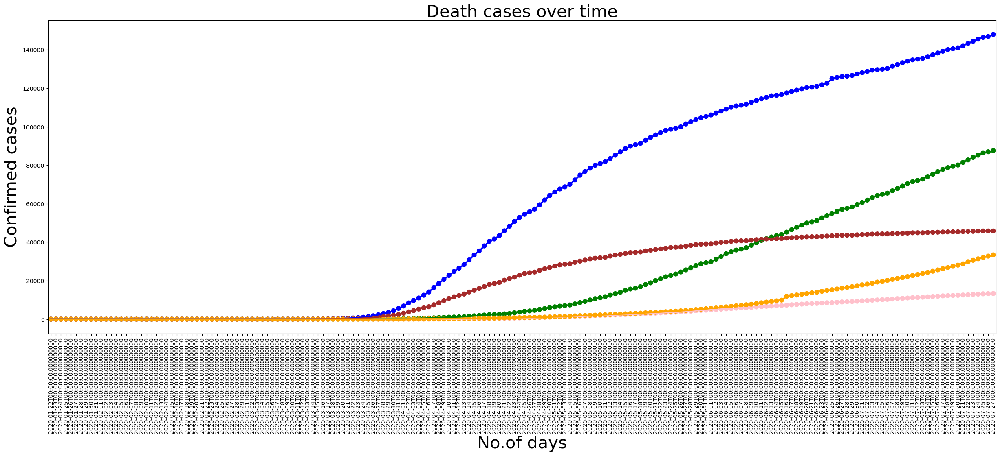

In [54]:
# PLOTTING CHANGE IN DEATHS CASES OVER TIME IN TOP 5 COUNTRIES

plt.figure(figsize=(30,10))
sns.pointplot(x=brazil.date,y=brazil.deaths,color="Green")
sns.pointplot(x=usa.date,y=usa.deaths,color="Blue")
sns.pointplot(x=russia.date,y=russia.deaths,color="Pink")
sns.pointplot(x=uk.date,y=uk.deaths,color="Brown")
sns.pointplot(x=india.date,y=india.deaths,color="Orange")
plt.xlabel('No.of days',fontsize=30)
plt.ylabel('Confirmed cases',fontsize=30)
plt.xticks(rotation=90)
plt.title('Death cases over time',fontsize=30)
plt.show()

# INSIGHTS

# # USA has the most death cases followed by Brazil annd Uk
# UK death cased reduced in June and july 
# India death cases took a drastic jump higher in June and July 


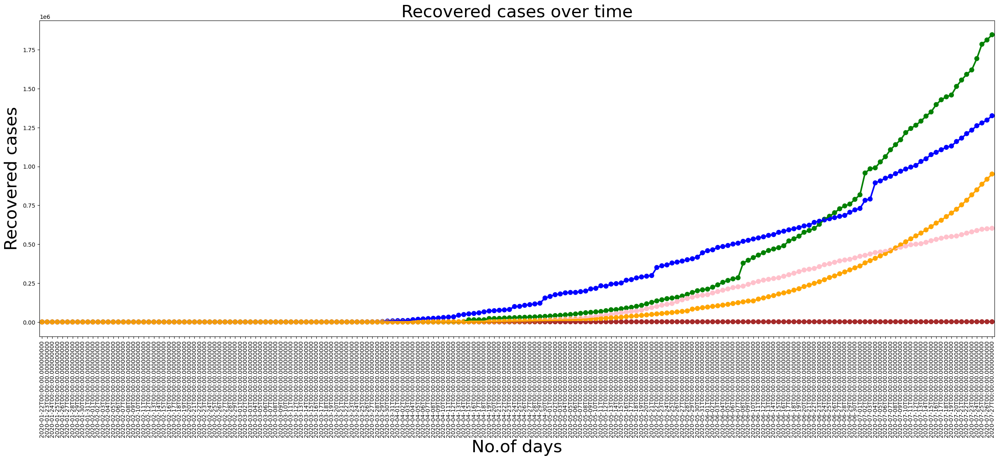

In [55]:
# PLOTTING CHANGE IN RECOVERED CASES OVER TIME IN TOP 5 COUNTRIES

plt.figure(figsize=(30,10))
sns.pointplot(x=brazil.date,y=brazil.recovered,color="Green")
sns.pointplot(x=usa.date,y=usa.recovered,color="Blue")
sns.pointplot(x=russia.date,y=russia.recovered,color="Pink")
sns.pointplot(x=uk.date,y=uk.recovered,color="Brown")
sns.pointplot(x=india.date,y=india.recovered,color="Orange")
plt.xlabel('No.of days',fontsize=30)
plt.ylabel('Recovered cases',fontsize=30)
plt.xticks(rotation=90)
plt.title('Recovered cases over time',fontsize=30)
plt.show()

# INSIGHTS

# # Brazil recovery rate is much higher than Us though the number of active cases were higher in US 
# by a huge margin
# Recovery cases of UK is the least and going down in negative 
# India also has a good recovery rate

In [56]:
# FORECASTING THE FUTURE WITH FBPROPHET

In [57]:
from prophet import Prophet

In [58]:
df

,state,country,lat,long,date,confirmed,deaths,recovered,active,WHO Region
0,NaN,Afghanistan,33.939110,67.709953,2020-01-22,0,0,0,0,Eastern Mediterranean
1,NaN,Albania,41.153300,20.168300,2020-01-22,0,0,0,0,Europe
2,NaN,Algeria,28.033900,1.659600,2020-01-22,0,0,0,0,Africa
3,NaN,Andorra,42.506300,1.521800,2020-01-22,0,0,0,0,Europe
4,NaN,Angola,-11.202700,17.873900,2020-01-22,0,0,0,0,Africa
...,...,...,...,...,...,...,...,...,...,...
49063,NaN,Sao Tome and Principe,0.186400,6.613100,2020-07-27,865,14,734,117,Africa
49064,NaN,Yemen,15.552727,48.516388,2020-07-27,1691,483,833,375,Eastern Mediterranean
49065,NaN,Comoros,-11.645500,43.333300,2020-07-27,354,7,328,19,Africa
49066,NaN,Tajikistan,38.861000,71.276100,2020-07-27,7235,60,6028,1147,Europe


In [59]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 49068 entries, 0 to 49067
Data columns (total 10 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   state       14664 non-null  object        
 1   country     49068 non-null  object        
 2   lat         49068 non-null  float64       
 3   long        49068 non-null  float64       
 4   date        49068 non-null  datetime64[ns]
 5   confirmed   49068 non-null  int64         
 6   deaths      49068 non-null  int64         
 7   recovered   49068 non-null  int64         
 8   active      49068 non-null  int64         
 9   WHO Region  49068 non-null  object        
dtypes: datetime64[ns](1), float64(2), int64(4), object(3)
memory usage: 3.7+ MB


In [62]:
confirmed = df.groupby('date').sum()['confirmed'].reset_index()
confirmed

,date,confirmed
0,2020-01-22,555
1,2020-01-23,654
2,2020-01-24,941
3,2020-01-25,1434
4,2020-01-26,2118
...,...,...
183,2020-07-23,15510481
184,2020-07-24,15791645
185,2020-07-25,16047190
186,2020-07-26,16251796


In [ ]:
# FORECASTING FOR CONFIRMED CASES

# For building a forecasting model using fbProphet library,
# there should be only 2 columns passed
# The column names should always be --> 'ds','y'

In [64]:
confirmed =confirmed.rename(columns = {'date' : 'ds', 'confirmed':'y'})

In [66]:
con_model =Prophet(interval_width = 0.95)

In [67]:
con_model = con_model.fit(confirmed)

20:52:30 - cmdstanpy - INFO - Chain [1] start processing
20:52:31 - cmdstanpy - INFO - Chain [1] done processing


In [69]:
con_model.seasonalities

OrderedDict([('weekly',
              {'period': 7,
               'fourier_order': 3,
               'prior_scale': 10.0,
               'mode': 'additive',
               'condition_name': None})])

In [ ]:
# TO MAKE A PREDICTION, WE NEED FUTURE DATES

In [75]:
future=con_model.make_future_dataframe(periods=90,freq='D')
future

,ds
0,2020-01-22
1,2020-01-23
2,2020-01-24
3,2020-01-25
4,2020-01-26
...,...
273,2020-10-21
274,2020-10-22
275,2020-10-23
276,2020-10-24


In [72]:
confirmed.shape

(188, 2)

In [77]:
future.shape

(278, 1)

In [78]:
# Future prediction

prediction=con_model.predict(future)
prediction

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2020-01-22,-9.517628e+03,-1.618636e+05,1.457728e+05,-9.517628e+03,-9.517628e+03,-11026.270885,-11026.270885,-11026.270885,-11026.270885,-11026.270885,-11026.270885,0.0,0.0,0.0,-2.054390e+04
1,2020-01-23,-6.823686e+03,-1.654740e+05,1.548608e+05,-6.823686e+03,-6.823686e+03,-1121.544798,-1121.544798,-1121.544798,-1121.544798,-1121.544798,-1121.544798,0.0,0.0,0.0,-7.945231e+03
2,2020-01-24,-4.129744e+03,-1.523551e+05,1.636568e+05,-4.129744e+03,-4.129744e+03,10058.550707,10058.550707,10058.550707,10058.550707,10058.550707,10058.550707,0.0,0.0,0.0,5.928807e+03
3,2020-01-25,-1.435801e+03,-1.598854e+05,1.786484e+05,-1.435801e+03,-1.435801e+03,13746.669979,13746.669979,13746.669979,13746.669979,13746.669979,13746.669979,0.0,0.0,0.0,1.231087e+04
4,2020-01-26,1.258141e+03,-1.467335e+05,1.641107e+05,1.258141e+03,1.258141e+03,7281.306066,7281.306066,7281.306066,7281.306066,7281.306066,7281.306066,0.0,0.0,0.0,8.539447e+03
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
273,2020-10-21,3.367537e+07,2.984408e+07,3.730047e+07,2.991378e+07,3.732606e+07,-11026.270885,-11026.270885,-11026.270885,-11026.270885,-11026.270885,-11026.270885,0.0,0.0,0.0,3.366435e+07
274,2020-10-22,3.387936e+07,3.002586e+07,3.752376e+07,3.006680e+07,3.761032e+07,-1121.544798,-1121.544798,-1121.544798,-1121.544798,-1121.544798,-1121.544798,0.0,0.0,0.0,3.387824e+07
275,2020-10-23,3.408334e+07,3.021302e+07,3.790550e+07,3.020170e+07,3.789525e+07,10058.550707,10058.550707,10058.550707,10058.550707,10058.550707,10058.550707,0.0,0.0,0.0,3.409340e+07
276,2020-10-24,3.428733e+07,3.026970e+07,3.822180e+07,3.033023e+07,3.817652e+07,13746.669979,13746.669979,13746.669979,13746.669979,13746.669979,13746.669979,0.0,0.0,0.0,3.430107e+07


In [79]:
prediction[['ds','yhat','yhat_lower','yhat_lower']]

,ds,yhat,yhat_lower,yhat_lower
0,2020-01-22,-2.054390e+04,-1.618636e+05,-1.618636e+05
1,2020-01-23,-7.945231e+03,-1.654740e+05,-1.654740e+05
2,2020-01-24,5.928807e+03,-1.523551e+05,-1.523551e+05
3,2020-01-25,1.231087e+04,-1.598854e+05,-1.598854e+05
4,2020-01-26,8.539447e+03,-1.467335e+05,-1.467335e+05
...,...,...,...,...
273,2020-10-21,3.366435e+07,2.984408e+07,2.984408e+07
274,2020-10-22,3.387824e+07,3.002586e+07,3.002586e+07
275,2020-10-23,3.409340e+07,3.021302e+07,3.021302e+07
276,2020-10-24,3.430107e+07,3.026970e+07,3.026970e+07


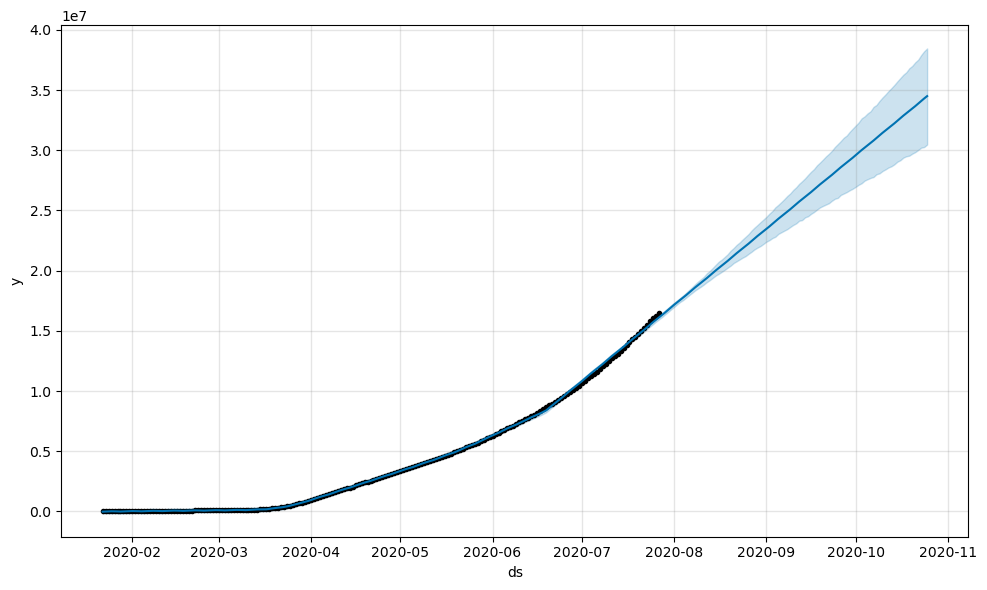

In [80]:
confirmed_cases = con_model.plot(prediction)

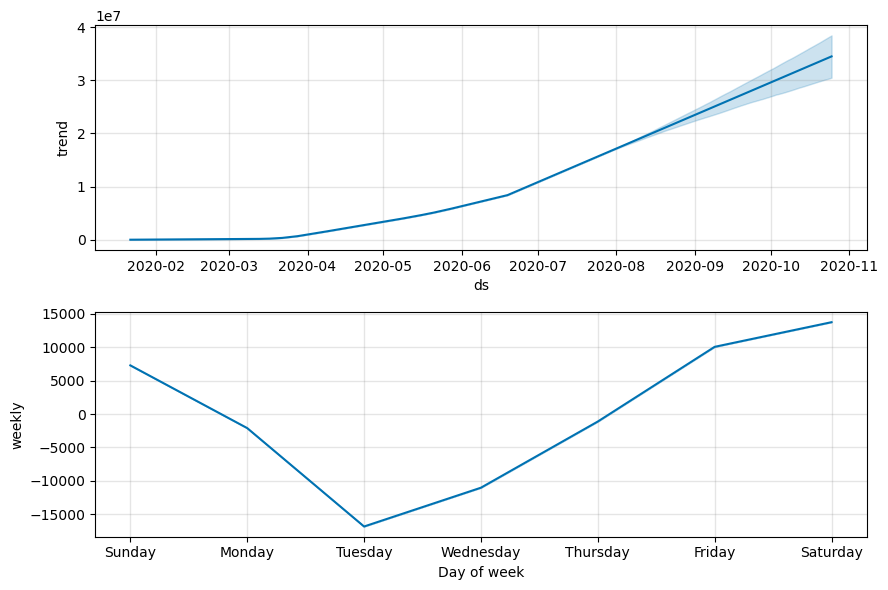

In [81]:
confirmed_forecast_plot1 = con_model.plot_components(prediction)